In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
pd.set_option('display.max_columns',None)
df = pd.read_csv('Data file.csv')
df.head()

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22


The column "Unnamed: 0" is an irrelevant column, so let us drop it.

In [3]:
df.drop('Unnamed: 0',axis=1,inplace=True)

In [4]:
df.head()

,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,2016-07-20
1,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,2016-08-10
2,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,2016-08-19
3,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,2016-06-06
4,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,2016-06-22


In [5]:
#Unique values in the target column
print(df['label'].unique())

[0 1]


The column "msisdn" contains the mobile number of the customer and is irrelevant for us, so let us drop it.

In [6]:
df.drop('msisdn',axis=1,inplace=True)

In [7]:
df.shape

(209593, 35)

In [8]:
df.isnull().sum()

label                   0
aon                     0
daily_decr30            0
daily_decr90            0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
pcircle                 0
pdate                   0
dtype: int64

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 35 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   label                 209593 non-null  int64  
 1   aon                   209593 non-null  float64
 2   daily_decr30          209593 non-null  float64
 3   daily_decr90          209593 non-null  float64
 4   rental30              209593 non-null  float64
 5   rental90              209593 non-null  float64
 6   last_rech_date_ma     209593 non-null  float64
 7   last_rech_date_da     209593 non-null  float64
 8   last_rech_amt_ma      209593 non-null  int64  
 9   cnt_ma_rech30         209593 non-null  int64  
 10  fr_ma_rech30          209593 non-null  float64
 11  sumamnt_ma_rech30     209593 non-null  float64
 12  medianamnt_ma_rech30  209593 non-null  float64
 13  medianmarechprebal30  209593 non-null  float64
 14  cnt_ma_rech90         209593 non-null  int64  
 15  

We can see that 2 columns are non-numerical.

In [10]:
df['pcircle'].value_counts()

UPW    209593
Name: pcircle, dtype: int64

The column 'pcircle' has only 1 unique value, so we can drop it.

In [11]:
df.drop('pcircle',axis=1,inplace=True)

In [12]:
df['pdate'].value_counts()

2016-07-04    3150
2016-07-05    3127
2016-07-07    3116
2016-06-20    3099
2016-06-17    3082
              ... 
2016-06-04    1559
2016-08-18    1407
2016-08-19    1132
2016-08-20     788
2016-08-21     324
Name: pdate, Length: 82, dtype: int64

In [13]:
df['pdate'].value_counts()

2016-07-04    3150
2016-07-05    3127
2016-07-07    3116
2016-06-20    3099
2016-06-17    3082
              ... 
2016-06-04    1559
2016-08-18    1407
2016-08-19    1132
2016-08-20     788
2016-08-21     324
Name: pdate, Length: 82, dtype: int64

We can see that the data is from the same year so we do not need to extract the year from that column.

In [14]:
df['pdate'] = pd.to_datetime(df['pdate'],format='%Y-%m-%d')
df['month'] = df['pdate'].dt.month
df['day'] = df['pdate'].dt.day

In [15]:
df.drop('pdate',axis=1,inplace=True)

In [16]:
df.shape

(209593, 35)

In [17]:
df.columns.to_list()

['label',
 'aon',
 'daily_decr30',
 'daily_decr90',
 'rental30',
 'rental90',
 'last_rech_date_ma',
 'last_rech_date_da',
 'last_rech_amt_ma',
 'cnt_ma_rech30',
 'fr_ma_rech30',
 'sumamnt_ma_rech30',
 'medianamnt_ma_rech30',
 'medianmarechprebal30',
 'cnt_ma_rech90',
 'fr_ma_rech90',
 'sumamnt_ma_rech90',
 'medianamnt_ma_rech90',
 'medianmarechprebal90',
 'cnt_da_rech30',
 'fr_da_rech30',
 'cnt_da_rech90',
 'fr_da_rech90',
 'cnt_loans30',
 'amnt_loans30',
 'maxamnt_loans30',
 'medianamnt_loans30',
 'cnt_loans90',
 'amnt_loans90',
 'maxamnt_loans90',
 'medianamnt_loans90',
 'payback30',
 'payback90',
 'month',
 'day']

In [18]:
df['last_rech_date_da'].value_counts()

0.000000         202861
7.000000            163
8.000000            160
11.000000           149
13.000000           148
                  ...  
635922.630667         1
684933.969169         1
779774.580500         1
627095.756936         1
508947.450202         1
Name: last_rech_date_da, Length: 1174, dtype: int64

Most of the values in the column "last_rech_date_da" have 0 as the value.

In [19]:
df['cnt_da_rech30'].value_counts()

0.000000        205479
1.000000          2331
2.000000           372
3.000000           156
4.000000            86
                 ...  
63823.301647         1
32152.874529         1
45934.211400         1
57073.740639         1
38828.342205         1
Name: cnt_da_rech30, Length: 1066, dtype: int64

The column "cnt_da_rech30" has mostly sero's as the value

In [20]:
df['fr_da_rech30'].value_counts()

0.000000         208014
3.000000             64
1.000000             55
2.000000             51
7.000000             47
                  ...  
738055.326743         1
811998.243560         1
792892.884579         1
540679.626283         1
849620.029563         1
Name: fr_da_rech30, Length: 1072, dtype: int64

The column "fa_da_rech30" has mostly sero's as the value

In [21]:
df['cnt_da_rech90'].value_counts()

0     204226
1       4173
2        556
3        227
4        150
5         74
6         49
7         36
8         30
9         18
14        10
12         7
11         7
10         6
13         6
16         4
18         3
15         2
30         1
17         1
19         1
20         1
22         1
25         1
27         1
28         1
38         1
Name: cnt_da_rech90, dtype: int64

The column "cnt_da_rech90" has most rows filled with zero as the value

In [22]:
df['cnt_da_rech30'].value_counts()

0.000000        205479
1.000000          2331
2.000000           372
3.000000           156
4.000000            86
                 ...  
63823.301647         1
32152.874529         1
45934.211400         1
57073.740639         1
38828.342205         1
Name: cnt_da_rech30, Length: 1066, dtype: int64

The column "cnt_da_rech30" has most rows filled with zero as the value

In [23]:
df['fr_da_rech30'].value_counts()

0.000000         208014
3.000000             64
1.000000             55
2.000000             51
7.000000             47
                  ...  
738055.326743         1
811998.243560         1
792892.884579         1
540679.626283         1
849620.029563         1
Name: fr_da_rech30, Length: 1072, dtype: int64

The column "fr_da_rech30" has most rows filled with zero as the value

In [24]:
df['cnt_da_rech90'].value_counts()

0     204226
1       4173
2        556
3        227
4        150
5         74
6         49
7         36
8         30
9         18
14        10
12         7
11         7
10         6
13         6
16         4
18         3
15         2
30         1
17         1
19         1
20         1
22         1
25         1
27         1
28         1
38         1
Name: cnt_da_rech90, dtype: int64

The column "cnt_da_rech90" has most rows filled with zero as the value

In [25]:
df['fr_da_rech90'].value_counts()

0     208728
3         78
1         66
2         66
4         56
7         55
6         52
5         45
8         44
10        33
9         32
14        32
11        30
12        27
19        22
28        19
13        17
15        17
18        16
29        15
16        14
17        14
22        11
25        11
21        10
20         9
24         8
27         8
32         8
26         7
30         7
31         6
34         5
23         5
37         5
57         3
35         2
41         2
46         1
56         1
55         1
33         1
43         1
42         1
39         1
64         1
Name: fr_da_rech90, dtype: int64

The column "fr_da_rech90" has most rows filled with zero as the value

In [26]:
df['medianamnt_loans30'].value_counts()

0.0    195445
1.0      7149
0.5      6538
2.0       420
1.5        38
3.0         3
Name: medianamnt_loans30, dtype: int64

The column "medianamnt_loans30" has most rows filled with zero as the value

In [27]:
df['medianamnt_loans90'].value_counts()

0.0    197424
1.0      6172
0.5      5668
2.0       307
1.5        19
3.0         3
Name: medianamnt_loans90, dtype: int64

The column "medianamnt_loans90" has most rows filled with zero as the value

Final Observations, the below columns have alarge number of zero's as the values, which will cause a lot of skewness, so let us  us drop them.
1. last_rech_date_da
2. cnt_da_rech30
3. fr_da_rech30
4. cnt_da_rech90
5. cnt_da_rech30
6. fr_da_rech30
7. cnt_da_rech90
8. fr_da_rech90
9. medianamnt_loans30
10. medianamnt_loans90

In [28]:
df.drop(columns=['last_rech_date_da','cnt_da_rech30','fr_da_rech30','cnt_da_rech90','cnt_da_rech30','fr_da_rech30',
       'cnt_da_rech90','fr_da_rech90','medianamnt_loans30','medianamnt_loans90'],axis=1,inplace=True)

In [29]:
df.shape

(209593, 28)

In [30]:
df.describe()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,month,day
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000
mean,0.875177,8112.343445,5381.402289,6082.515068,2692.581910,3483.406534,3755.847800,2064.452797,3.978057,3737.355121,7704.501157,1812.817952,3851.927942,6.31543,7.716780,12396.218352,1864.595821,92.025541,2.758981,17.952021,274.658747,18.520919,23.645398,6.703134,3.398826,4.321485,6.797321,14.39894
std,0.330519,75696.082531,9220.623400,10918.812767,4308.586781,5770.461279,53905.892230,2370.786034,4.256090,53643.625172,10139.621714,2070.864620,54006.374433,7.19347,12.590251,16857.793882,2081.680664,369.215658,2.554502,17.379741,4245.264648,224.797423,26.469861,2.103864,8.813729,10.308108,0.741435,8.43890
min,0.000000,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-200.000000,0.00000,0.000000,0.000000,0.000000,-200.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,1.00000
25%,1.000000,246.000000,42.440000,42.692000,280.420000,300.260000,1.000000,770.000000,1.000000,0.000000,1540.000000,770.000000,11.000000,2.00000,0.000000,2317.000000,773.000000,14.600000,1.000000,6.000000,6.000000,1.000000,6.000000,6.000000,0.000000,0.000000,6.000000,7.00000
50%,1.000000,527.000000,1469.175667,1500.000000,1083.570000,1334.000000,3.000000,1539.000000,3.000000,2.000000,4628.000000,1539.000000,33.900000,4.00000,2.000000,7226.000000,1539.000000,36.000000,2.000000,12.000000,6.000000,2.000000,12.000000,6.000000,0.000000,1.666667,7.000000,14.00000
75%,1.000000,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,7.000000,2309.000000,5.000000,6.000000,10010.000000,1924.000000,83.000000,8.00000,8.000000,16000.000000,1924.000000,79.310000,4.000000,24.000000,6.000000,5.000000,30.000000,6.000000,3.750000,4.500000,7.000000,21.00000
max,1.000000,999860.755168,265926.000000,320630.000000,198926.110000,200148.110000,998650.377733,55000.000000,203.000000,999606.368132,810096.000000,55000.000000,999479.419319,336.00000,88.000000,953036.000000,55000.000000,41456.500000,50.000000,306.000000,99864.560864,4997.517944,438.000000,12.000000,171.500000,171.500000,8.000000,31.00000


Observations:
1. The column aon(age on cellular network in days) cannot be negative.
2. The column daily_decr30(Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)) cannot be negative.
3. The column daily_decr90( Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)) cannot be negative.
4. The column rental30(Average main account balance over last 30 days) cannot be negative.
5. The column rental90(Average main account balance over last 90 days) cannot be negative.
6. The column last_rech_date_ma(Number of days till last recharge of main account) cannot be negative.
7. The column medianmarechprebal30(Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)) cannot be negative.
8. The column medianmarechprebal90(Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)) cannot be negative.

Let us make these values positive.

In [31]:
df['aon']=abs(df['aon'])
df['daily_decr30']=abs(df['daily_decr30'])
df['daily_decr90']=abs(df['daily_decr90'])
df['rental30']=abs(df['rental30'])
df['rental90']=abs(df['rental90'])
df['last_rech_date_ma']=abs(df['last_rech_date_ma'])
df['medianmarechprebal30']=abs(df['medianmarechprebal30'])
df['medianmarechprebal90']=abs(df['medianmarechprebal90'])

In [32]:
df.loc[(df['maxamnt_loans30'] != 6.0) & (df['maxamnt_loans30'] != 12.0) & (df['maxamnt_loans30']!=0.0), 'maxamnt_loans30']

118       61907.697372
125       22099.413732
146       98745.934048
369       58925.364061
374       78232.464324
              ...     
209189    50824.996349
209262    17324.994582
209331    92864.501728
209392    54259.265687
209424    96927.243252
Name: maxamnt_loans30, Length: 1047, dtype: float64

Here we can see that 1047 entries have values other than the values 0, 6, and 12.

In [33]:
df['maxamnt_loans30'].value_counts()

6.000000        179193
12.000000        26109
0.000000          3244
59275.166722         1
68599.755670         1
                 ...  
26462.333521         1
53666.885900         1
67319.013426         1
36610.121211         1
28708.879352         1
Name: maxamnt_loans30, Length: 1050, dtype: int64

Since most values are filled with the value 6 let us fill those 1047 entries with the value 6.

In [34]:
df.loc[(df['maxamnt_loans30'] != 6.0) & (df['maxamnt_loans30'] != 12.0) & (df['maxamnt_loans30']!=0.0), 'maxamnt_loans30'] = 6.0

In [35]:
df['maxamnt_loans30'].value_counts()

6.0     180240
12.0     26109
0.0       3244
Name: maxamnt_loans30, dtype: int64

In [36]:
df.describe()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,month,day
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000
mean,0.875177,8112.808718,5381.431293,6082.544140,2715.376558,3509.497148,3756.125844,2064.452797,3.978057,3737.355121,7704.501157,1812.817952,3854.219020,6.31543,7.716780,12396.218352,1864.595821,94.436315,2.758981,17.952021,6.654554,18.520919,23.645398,6.703134,3.398826,4.321485,6.797321,14.39894
std,0.330519,75696.032666,9220.606472,10918.796572,4294.257439,5754.630600,53905.872857,2370.786034,4.256090,53643.625172,10139.621714,2070.864620,54006.210975,7.19347,12.590251,16857.793882,2081.680664,368.606406,2.554502,17.379741,2.147858,224.797423,26.469861,2.103864,8.813729,10.308108,0.741435,8.43890
min,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,1.00000
25%,1.000000,246.000000,42.453000,42.693333,299.700000,330.000000,1.000000,770.000000,1.000000,0.000000,1540.000000,770.000000,11.670000,2.00000,0.000000,2317.000000,773.000000,15.300000,1.000000,6.000000,6.000000,1.000000,6.000000,6.000000,0.000000,0.000000,6.000000,7.00000
50%,1.000000,527.000000,1469.175667,1500.000000,1095.750000,1347.220000,3.000000,1539.000000,3.000000,2.000000,4628.000000,1539.000000,35.000000,4.00000,2.000000,7226.000000,1539.000000,37.000000,2.000000,12.000000,6.000000,2.000000,12.000000,6.000000,0.000000,1.666667,7.000000,14.00000
75%,1.000000,982.000000,7244.000000,7802.790000,3362.350000,4204.510000,7.000000,2309.000000,5.000000,6.000000,10010.000000,1924.000000,85.300000,8.00000,8.000000,16000.000000,1924.000000,81.500000,4.000000,24.000000,6.000000,5.000000,30.000000,6.000000,3.750000,4.500000,7.000000,21.00000
max,1.000000,999860.755168,265926.000000,320630.000000,198926.110000,200148.110000,998650.377733,55000.000000,203.000000,999606.368132,810096.000000,55000.000000,999479.419319,336.00000,88.000000,953036.000000,55000.000000,41456.500000,50.000000,306.000000,12.000000,4997.517944,438.000000,12.000000,171.500000,171.500000,8.000000,31.00000


In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 28 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   label                 209593 non-null  int64  
 1   aon                   209593 non-null  float64
 2   daily_decr30          209593 non-null  float64
 3   daily_decr90          209593 non-null  float64
 4   rental30              209593 non-null  float64
 5   rental90              209593 non-null  float64
 6   last_rech_date_ma     209593 non-null  float64
 7   last_rech_amt_ma      209593 non-null  int64  
 8   cnt_ma_rech30         209593 non-null  int64  
 9   fr_ma_rech30          209593 non-null  float64
 10  sumamnt_ma_rech30     209593 non-null  float64
 11  medianamnt_ma_rech30  209593 non-null  float64
 12  medianmarechprebal30  209593 non-null  float64
 13  cnt_ma_rech90         209593 non-null  int64  
 14  fr_ma_rech90          209593 non-null  int64  
 15  

We can see that all our columns are now numerical columns.

In [38]:
column = [ 'aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90', 'month', 'day']

Let us now see the distribution of the data for all the features except the target, that is label.

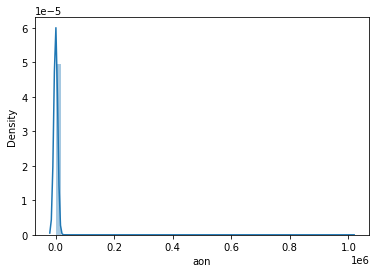

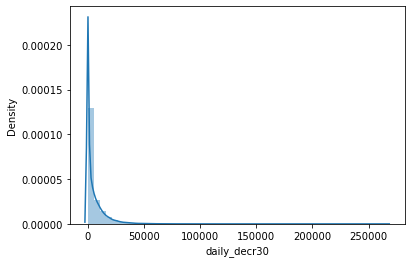

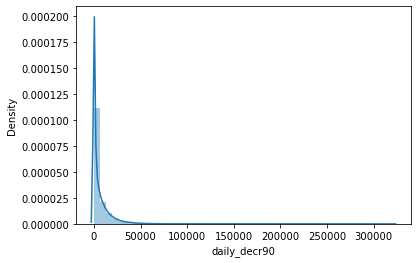

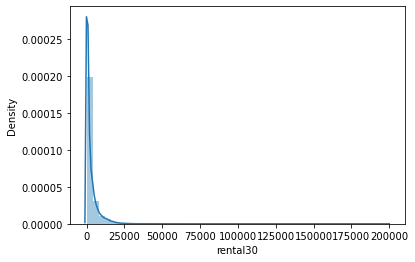

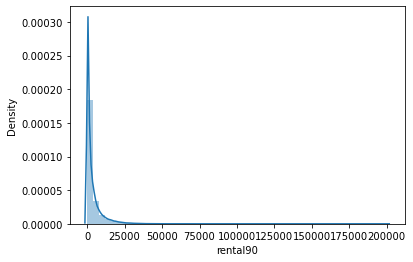

...

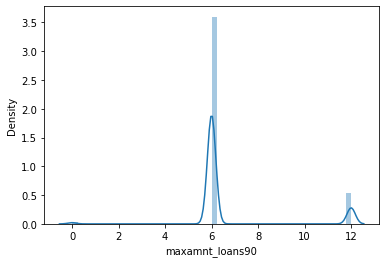

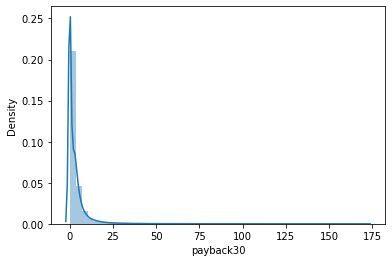

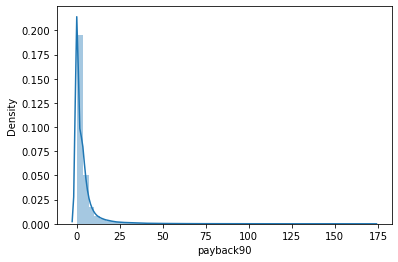

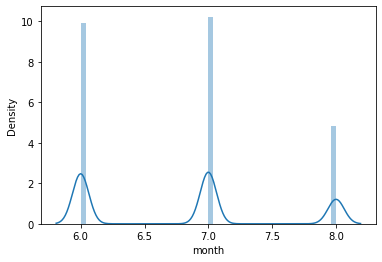

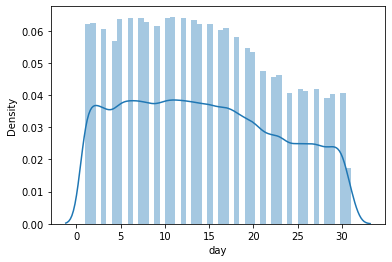

In [39]:
for i in column:
    sns.distplot(df[i])
    plt.show()

As we can see all the columns have skewness.

# Data Visualization

<AxesSubplot:xlabel='label', ylabel='count'>

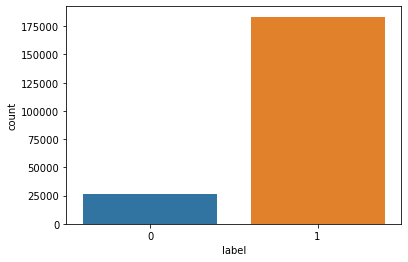

In [40]:
sns.countplot(df['label'])
#0 - Defaulter, 1 - Non-Defaulter

We can see that there is a lot of data imbalance, we can solve this problem by Oversampling the data.

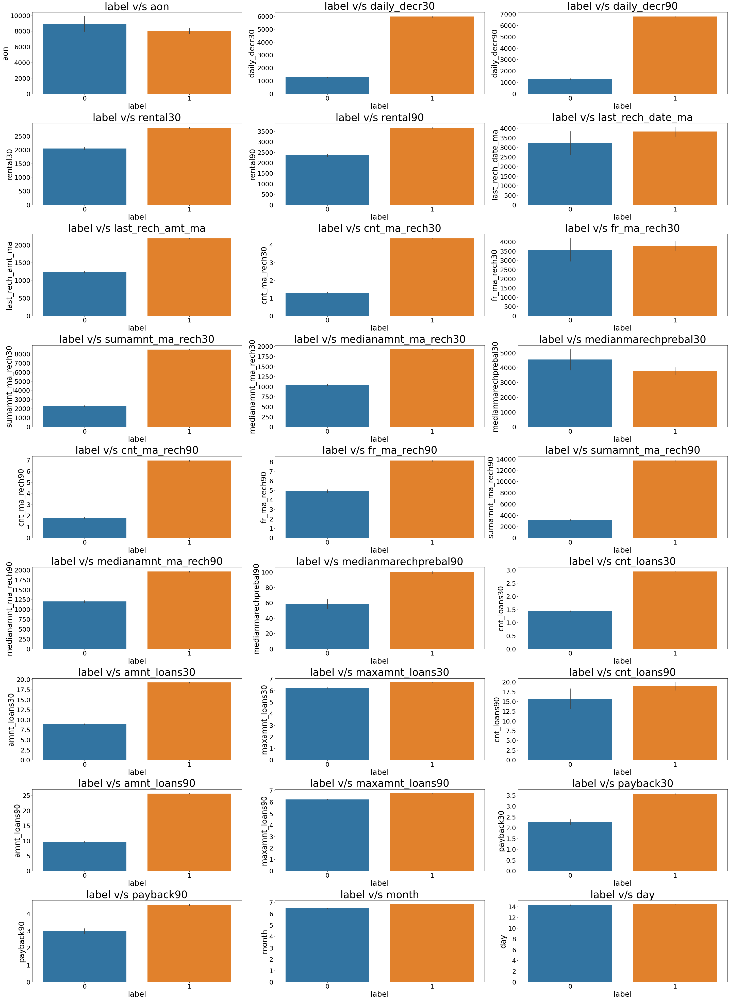

In [41]:
plt.figure(figsize=(40,60))
for i in range(len(column)):
    plt.subplot(10,3,i+1)
    sns.barplot(df['label'],df[column[i]])
    plt.title(f"label v/s {column[i]}",fontsize=40)
    plt.xticks(fontsize=25)  
    plt.yticks(fontsize=25)
    plt.xlabel('label',fontsize=30)
    plt.ylabel(column[i],fontsize=30)
    plt.tight_layout()

Observations:
1. We can see that the number of defaulters are more with high value of age.
2. Customers with high value of Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)(daily_decr30) are maximum Non-defaulters.
3. Customers with high value of Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)(daily_decr90) are maximum Non-defaulters.
4. Customers with high value of Average main account balance over last 30 days(rental30) are maximum Non-defaulters.
5. Customers with high value of Average main account balance over last 90 days(rental90) are maximum Non-defaulters.
6. Customers with high Number of days till last recharge of main account(last_rech_date_ma) are maximum Non-defaulters.
7. Customers with high value of Amount of last recharge of main account (in Indonesian Rupiah)(last_rech_amt_ma) are maximum Non-defaulters.
8. Customers with high value of Number of times main account got recharged in last 30 days(cnt_ma_rech30) are maximum Non-defaulters.
9. Customers with high value of Frequency of main account recharged in last 30 days(fr_ma_rech30) are maximum Non-defaulters.
10. Customers with high value of Total amount of recharge in main account over last 30 days (in Indonesian Rupiah)(sumamnt_ma_rech30) are maximum Non-defaulters.
11. Customers with high value of Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah)(medianamnt_ma_rech30) are maximum Non-defaulters.
12. Customers with high value of Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)(medianmarechprebal30) are maximum defaulters.
13. Customers with high value of Number of times main account got recharged in last 90 days(cnt_ma_rech90) are maximum Non-defaulters
14. Customers with high value of Frequency of main account recharged in last 90 days(fr_ma_rech90) are maximum Non-defaulters
15. Customers with high value of Total amount of recharge in main account over last 90 days (in Indonasian Rupiah)(sumamnt_ma_rech90) are maximum Non-defaulters.
16. Customers with high value of Median of amount of recharges done in main account over last 90 days at user level (in Indonasian Rupiah)(medianamnt_ma_rech90) are maximum Non-defaulters.
17. Customers with high value of Median of main account balance just before recharge in last 90 days at user level (in Indonasian Rupiah)(medianmarechprebal90) are maximum Non-defaulters.
18. Customers with high value of Number of loans taken by user in last 30 days(cnt_loans30) are maximum Non-defaulters
19. Customers with high value of Total amount of loans taken by user in last 30 days(amnt_loans30) are maximum Non-defaulters.
20. Customers with high value of maximum amount of loan taken by the user in last 30 days(maxamnt_loans30) are maximum Non-defaulters.
21. Customers with high value of Number of loans taken by user in last 90 days(cnt_loans90) are maximum Non-defaulters.
22. Customers with high value of Total amount of loans taken by user in last 90 days(amnt_loans90) are maximum Non-defaulters.
23. Customers with high value of maximum amount of loan taken by the user in last 90 days(maxamnt_loans90) are maximum Non-defaulters.
24. Customers with high value of Average payback time in days over last 30 days(payback30) are maximum Non-defaulters.
25. Customers with high value of Average payback time in days over last 90 days(payback90) are maximum Non-defaulters.
26. In between 6th and 7th month maximum customers both defualters and Non-defaulters have paid there loan amount.
27. Below 14th of each month all the customers have paid there loan amount.

# Checking Outliers

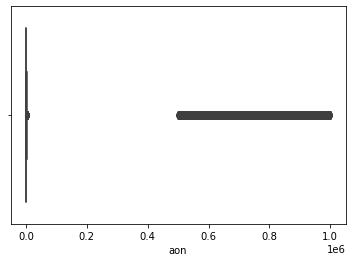

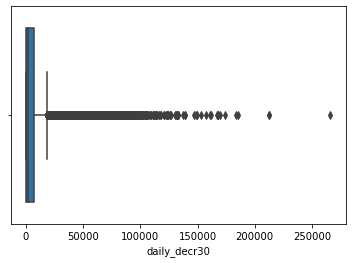

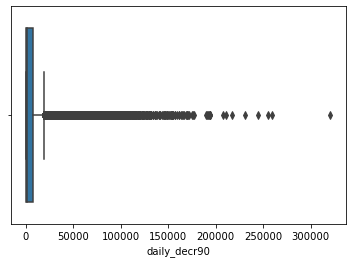

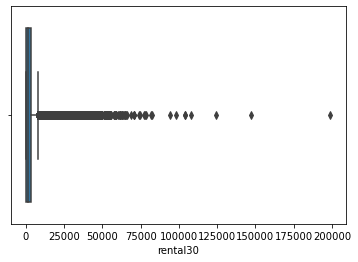

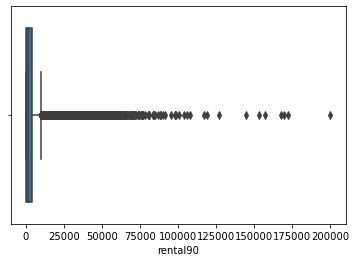

...

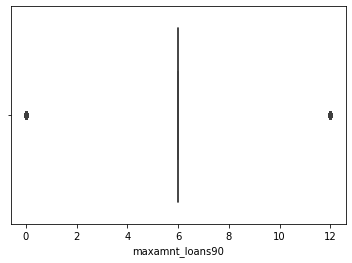

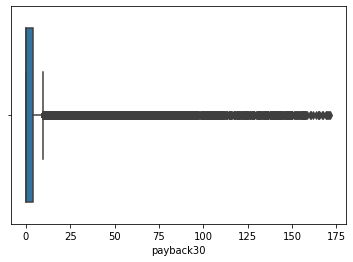

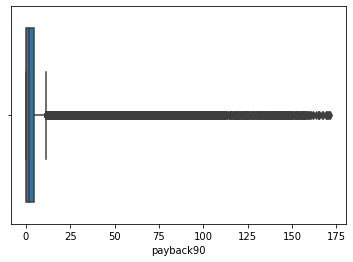

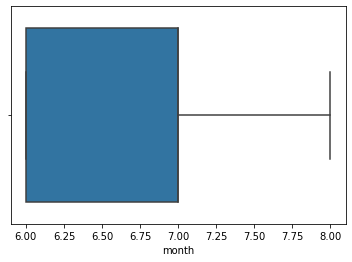

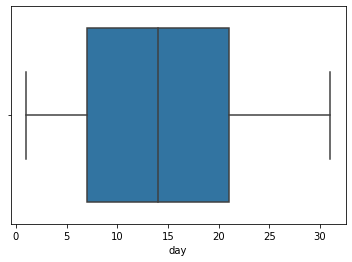

In [42]:
for i in column:
    sns.boxplot(df[i])
    plt.show()

We can see all the features except the day and month feature do not have outliers.

# Z-score

In [43]:
features=df[['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90']]

In [44]:
from scipy.stats import zscore
z=np.abs(zscore(features))
new_df=df[(z<3).all(axis=1)]
new_df.head()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,month,day
0,0,272.0,3055.050000,3065.150000,220.13,260.13,2.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,2,12,6.0,2.0,12,6,29.000000,29.000000,7,20
1,1,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,1,12,12.0,1.0,12,12,0.000000,0.000000,8,10
2,1,535.0,1398.000000,1398.000000,900.13,900.13,3.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,1,6,6.0,1.0,6,6,0.000000,0.000000,8,19
3,1,241.0,21.228000,21.228000,159.42,159.42,41.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,2,12,6.0,2.0,12,6,0.000000,0.000000,6,6
4,1,947.0,150.619333,150.619333,1098.90,1098.90,4.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,7,42,6.0,7.0,42,6,2.333333,2.333333,6,22


In [45]:
df.shape, new_df.shape

((209593, 28), (171081, 28))

In [46]:
data_loss = (209593-171081)/209593*100
data_loss

18.374659459046818

We have lost 18.37% data after removing outliers

### Rechecking if outliers have been reduced

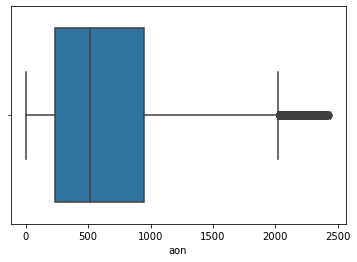

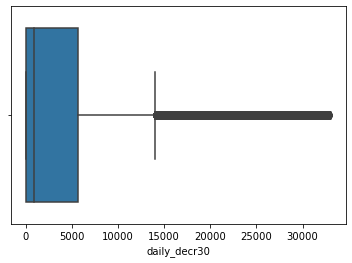

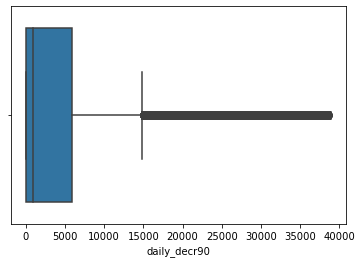

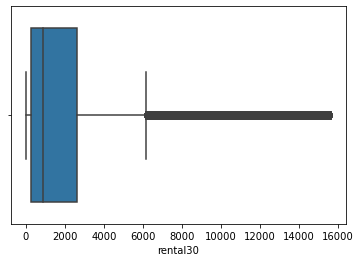

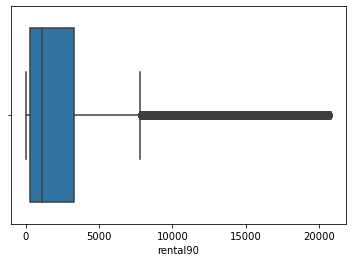

...

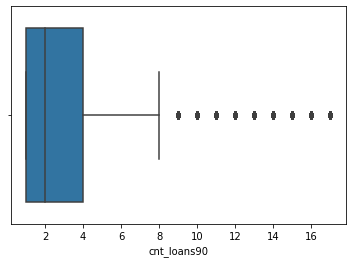

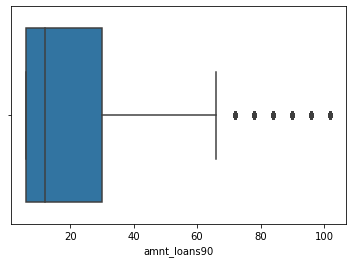

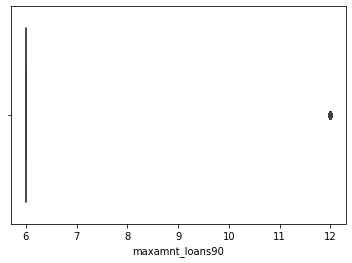

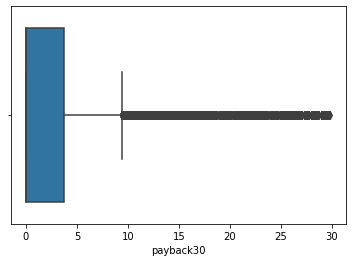

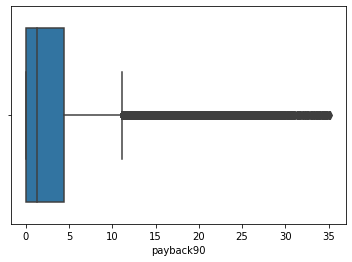

In [47]:
for i in features:
    sns.boxplot(new_df[i])
    plt.show()

We can see that, the outliers have been reduced.

# Checking Skewness

In [48]:
new_df.skew()

label                   -2.112938
aon                      0.962385
daily_decr30             1.967253
daily_decr90             2.084566
rental30                 2.218827
rental90                 2.258492
last_rech_date_ma        3.453393
last_rech_amt_ma         2.115490
cnt_ma_rech30            1.187204
fr_ma_rech30             2.005882
sumamnt_ma_rech30        1.640034
medianamnt_ma_rech30     2.315346
medianmarechprebal30    10.616811
cnt_ma_rech90            1.331616
fr_ma_rech90             1.982695
sumamnt_ma_rech90        1.711355
medianamnt_ma_rech90     2.357806
medianmarechprebal90     3.798097
cnt_loans30              1.502042
amnt_loans30             1.474463
maxamnt_loans30          2.640112
cnt_loans90              1.724149
amnt_loans90             1.708982
maxamnt_loans90          2.609447
payback30                2.625365
payback90                2.548092
month                    0.471537
day                      0.170935
dtype: float64

We can see that all features except day and month have skewness.

# Removing skewness using yeo-johnson method

In [49]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

In [50]:
features1=['aon', 'daily_decr30', 'daily_decr90', 'rental30', 'rental90', 'last_rech_date_ma', 'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30', 'sumamnt_ma_rech30', 'medianamnt_ma_rech30', 'medianmarechprebal30', 'cnt_ma_rech90', 'fr_ma_rech90', 'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90', 'cnt_loans30', 'amnt_loans30', 'maxamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90', 'payback30', 'payback90']

In [51]:
new_df[features1] = scaler.fit_transform(new_df[features1].values)

In [52]:
new_df.skew()

label                  -2.112938
aon                    -0.057568
daily_decr30           -0.111293
daily_decr90           -0.102912
rental30               -0.068188
rental90               -0.072287
last_rech_date_ma       0.037109
last_rech_amt_ma       -0.190797
cnt_ma_rech30          -0.025194
fr_ma_rech30            0.141392
sumamnt_ma_rech30      -0.457858
medianamnt_ma_rech30   -0.316798
medianmarechprebal30   -0.044589
cnt_ma_rech90          -0.028458
fr_ma_rech90            0.145168
sumamnt_ma_rech90      -0.365771
medianamnt_ma_rech90   -0.180886
medianmarechprebal90   -0.029900
cnt_loans30             0.223829
amnt_loans30            0.142281
maxamnt_loans30         0.000000
cnt_loans90             0.199770
amnt_loans90            0.130660
maxamnt_loans90         0.000000
payback30               0.323223
payback90               0.225067
month                   0.471537
day                     0.170935
dtype: float64

We have redused the skew from the columns.

In [53]:
corr = new_df.corr()
corr

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,month,day
label,1.000000,0.106708,0.265082,0.267123,0.130274,0.143862,0.078708,0.272007,0.354803,0.264358,0.371381,0.290574,0.282612,0.369356,0.248454,0.379306,0.263291,0.268431,0.286295,0.300503,0.088860,0.304464,0.316168,0.090329,0.253425,0.263379,0.138078,0.011740
aon,0.106708,1.000000,0.117926,0.118460,0.075756,0.083729,0.063086,0.089459,0.049478,0.074243,0.085897,0.090849,0.058453,0.070587,0.079838,0.102891,0.093134,0.057380,0.097051,0.101802,0.035912,0.130218,0.132139,0.036405,0.089881,0.115255,0.083673,0.020055
daily_decr30,0.265082,0.117926,1.000000,0.998696,0.543391,0.606094,0.159954,0.365739,0.470531,0.331053,0.522531,0.381432,0.282712,0.607583,0.268617,0.635990,0.357262,0.248477,0.379119,0.444226,0.363335,0.519753,0.565879,0.367342,0.348094,0.428815,0.820463,0.019257
daily_decr90,0.267123,0.118460,0.998696,1.000000,0.542895,0.609930,0.163506,0.365426,0.466808,0.330851,0.518309,0.379293,0.281961,0.610939,0.270191,0.638736,0.357572,0.249200,0.375222,0.441251,0.365549,0.521363,0.567806,0.370135,0.346669,0.430271,0.831853,0.013388
rental30,0.130274,0.075756,0.543391,0.542895,1.000000,0.974030,0.085969,0.274512,0.439573,0.280335,0.457216,0.314969,0.230985,0.489986,0.202434,0.489916,0.264242,0.183836,0.338835,0.369923,0.226171,0.413007,0.433201,0.229133,0.318031,0.353535,0.367281,0.131473
rental90,0.143862,0.083729,0.606094,0.609930,0.974030,1.000000,0.118689,0.286423,0.433201,0.286541,0.450111,0.311530,0.230965,0.522001,0.218620,0.520125,0.276083,0.193565,0.333777,0.372364,0.256390,0.437371,0.461809,0.260635,0.319477,0.374697,0.457498,0.116898
last_rech_date_ma,0.078708,0.063086,0.159954,0.163506,0.085969,0.118689,1.000000,0.565811,0.045046,0.082722,0.184217,0.371133,0.233000,0.160816,0.221630,0.319757,0.554905,0.376096,-0.032498,-0.024762,0.030148,0.018479,0.022690,0.030660,-0.066613,-0.000981,0.082181,0.036570
last_rech_amt_ma,0.272007,0.089459,0.365739,0.365426,0.274512,0.286423,0.565811,1.000000,0.363375,0.305797,0.675531,0.821624,0.457916,0.406563,0.364186,0.717691,0.906973,0.509794,0.221736,0.249309,0.155963,0.253207,0.273869,0.157429,0.181386,0.217498,0.134236,0.069209
cnt_ma_rech30,0.354803,0.049478,0.470531,0.466808,0.439573,0.433201,0.045046,0.363375,1.000000,0.483592,0.863595,0.450824,0.518498,0.915898,0.320753,0.785086,0.329437,0.426096,0.714959,0.717630,0.147491,0.698943,0.702014,0.149337,0.576304,0.534354,0.166106,0.115508
fr_ma_rech30,0.264358,0.074243,0.331053,0.330851,0.280335,0.286541,0.082722,0.305797,0.483592,1.000000,0.527427,0.409920,0.343891,0.482344,0.670128,0.498326,0.323397,0.266971,0.398865,0.405808,0.100550,0.417579,0.423516,0.102296,0.438961,0.423897,0.141296,0.096893


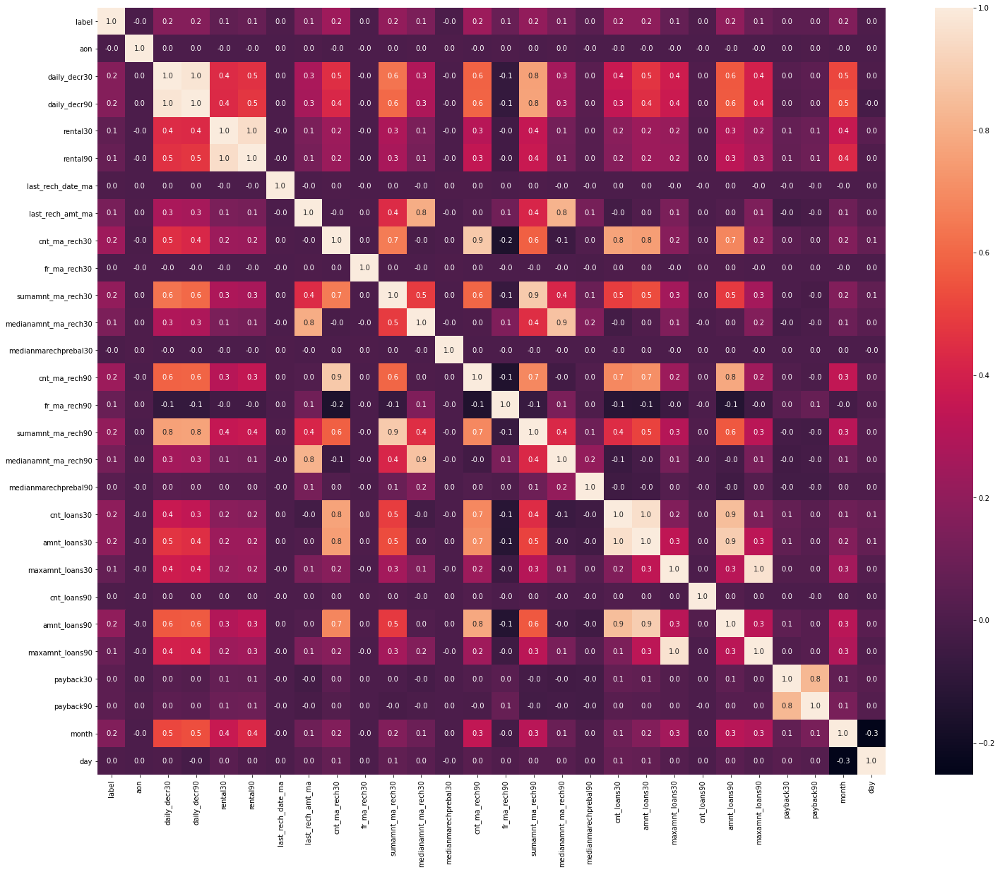

In [54]:
plt.figure(figsize=(25,20))
sns.heatmap(df.corr(), fmt='.1f', annot = True)
plt.yticks(rotation=0);

In [55]:
x = new_df.drop("label",axis=1)
y = new_df["label"]

# Data Scaling

In [56]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
X = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)

In [57]:
x.head()

,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_loans30,amnt_loans30,maxamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,payback30,payback90,month,day
0,-0.661970,0.656979,0.636359,-0.731303,-0.716067,-0.325895,0.182152,-0.234610,1.700759,-0.082954,0.305866,-0.670308,-0.525611,1.387520,-0.353680,0.247966,-0.794327,0.144992,0.085748,-4.579670e-16,-0.102968,-0.122383,-6.800116e-16,1.833041,1.869084,7,20
1,0.416872,1.263913,1.222554,0.980810,0.810274,1.536135,1.749573,-0.767576,-1.099858,0.362395,1.867722,0.447390,-0.974540,-1.167259,0.040411,1.951868,0.412780,-1.046304,0.085748,4.024558e-15,-1.104007,-0.122383,5.967449e-15,-0.903024,-0.975178,8,10
2,0.068630,0.342318,0.328440,-0.001413,-0.101610,-0.004938,0.182152,-0.767576,-1.099858,-0.475020,0.305866,0.499516,-0.974540,-1.167259,-0.702255,0.247966,0.470857,-1.046304,-1.102885,-4.579670e-16,-1.104007,-1.156011,-6.800116e-16,-0.903024,-0.975178,8,19
3,-0.779960,-1.025114,-1.023237,-0.870162,-0.919110,2.048350,-0.219562,-1.617778,-1.099858,-1.851759,-1.905853,-1.600758,-0.974540,-1.167259,-0.903414,-0.182000,-1.223342,0.144992,0.085748,-4.579670e-16,-0.102968,-0.122383,-6.800116e-16,-0.903024,-0.975178,6,6
4,0.790335,-0.449084,-0.449641,0.120536,0.012236,0.232090,0.580462,1.173394,0.176633,1.566083,0.702807,0.006354,0.808853,-0.016512,1.268118,0.945900,0.044156,1.658235,1.584987,-4.579670e-16,1.370820,1.296417,-6.800116e-16,0.702695,0.506352,6,22


# Oversampling

In [58]:
y.value_counts()

1    147664
0     23417
Name: label, dtype: int64

In [59]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
X, y = SM.fit_resample(X,y)

In [60]:
y.value_counts()

1    147664
0    147664
Name: label, dtype: int64

# Best Random State

In [61]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

In [62]:
from sklearn.tree import DecisionTreeClassifier
maxAccu=0
maxRS=0
for i in range(1,200):
    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.30, random_state =i)
    mod = DecisionTreeClassifier()
    mod.fit(X_train, y_train)
    pred = mod.predict(X_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.9110260838158444  on Random_state  52


In [63]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.30,random_state=maxRS)

# Model Building

In [64]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score, accuracy_score
from sklearn.model_selection import cross_val_score

# Decision Tree Classifier

In [65]:
DTC=DecisionTreeClassifier()
DTC.fit(X_train,y_train)
preddt=DTC.predict(X_test)
Accuracy_Score = accuracy_score(y_test, preddt)*100
print('Accuracy Score:',Accuracy_Score)
print('Confusion Matrix:',confusion_matrix(y_test, preddt))
print(classification_report(y_test,preddt))

Accuracy Score: 91.13082540434993
Confusion Matrix: [[40833  3580]
 [ 4278 39908]]
              precision    recall  f1-score   support

           0       0.91      0.92      0.91     44413
           1       0.92      0.90      0.91     44186

    accuracy                           0.91     88599
   macro avg       0.91      0.91      0.91     88599
weighted avg       0.91      0.91      0.91     88599



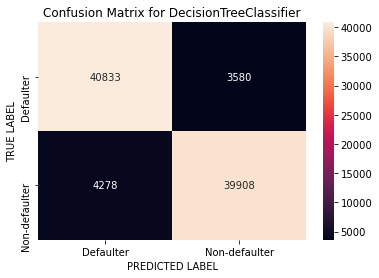

In [66]:
cm = confusion_matrix(y_test, preddt)

x_axis_labels = ["Defaulter","Non-defaulter"]
y_axis_labels = ["Defaulter","Non-defaulter"]

sns.heatmap(cm, annot = True, fmt = ".0f", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for DecisionTreeClassifier')
plt.show()

# Random Forest Classifier

In [67]:
RFC = RandomForestClassifier()
RFC.fit(X_train,y_train)
predRFC = RFC.predict(X_test)

print(accuracy_score(y_test, predRFC))
print(confusion_matrix(y_test, predRFC))
print(classification_report(y_test,predRFC))

0.9496946918136774
[[42454  1959]
 [ 2498 41688]]
              precision    recall  f1-score   support

           0       0.94      0.96      0.95     44413
           1       0.96      0.94      0.95     44186

    accuracy                           0.95     88599
   macro avg       0.95      0.95      0.95     88599
weighted avg       0.95      0.95      0.95     88599



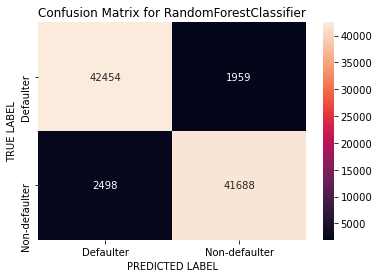

In [68]:
cm = confusion_matrix(y_test, predRFC)

x_axis_labels = ["Defaulter","Non-defaulter"]
y_axis_labels = ["Defaulter","Non-defaulter"]

sns.heatmap(cm, annot = True, fmt = ".0f", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()

# Logistic Regression

In [69]:
LR=LogisticRegression()
LR.fit(X_train,y_train)
predLR=LR.predict(X_test)

print(accuracy_score(y_test, predLR))
print(confusion_matrix(y_test, predLR))
print(classification_report(y_test,predLR))

0.770877775144189
[[35008  9405]
 [10895 33291]]
              precision    recall  f1-score   support

           0       0.76      0.79      0.78     44413
           1       0.78      0.75      0.77     44186

    accuracy                           0.77     88599
   macro avg       0.77      0.77      0.77     88599
weighted avg       0.77      0.77      0.77     88599



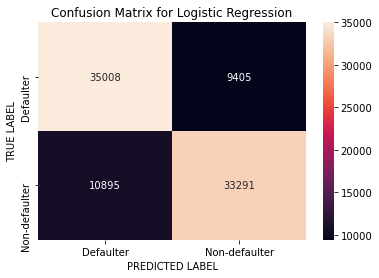

In [70]:
cm = confusion_matrix(y_test, predLR)

x_axis_labels = ["Defaulter","Non-defaulter"]
y_axis_labels = ["Defaulter","Non-defaulter"]

sns.heatmap(cm, annot = True, fmt = ".0f", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Logistic Regression')
plt.show()

# XGB Classifier

In [71]:
XGB=XGBClassifier(verbosity=0)
XGB.fit(X_train,y_train)
predxg=XGB.predict(X_test)
Accuracy_Score = accuracy_score(y_test, predxg)*100
print('Accuracy Score:',Accuracy_Score)
print('Confusion Matrix:',confusion_matrix(y_test, predxg))
print(classification_report(y_test,predxg))

Accuracy Score: 94.82499802480841
Confusion Matrix: [[41788  2625]
 [ 1960 42226]]
              precision    recall  f1-score   support

           0       0.96      0.94      0.95     44413
           1       0.94      0.96      0.95     44186

    accuracy                           0.95     88599
   macro avg       0.95      0.95      0.95     88599
weighted avg       0.95      0.95      0.95     88599



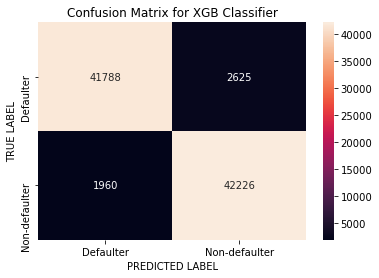

In [72]:
cm = confusion_matrix(y_test, predxg)

x_axis_labels = ["Defaulter","Non-defaulter"]
y_axis_labels = ["Defaulter","Non-defaulter"]

sns.heatmap(cm, annot = True, fmt = ".0f", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for XGB Classifier')
plt.show()

# AdaBoost Classifier

In [73]:
AB = AdaBoostClassifier()
AB.fit(X_train,y_train)
predAB = AB.predict(X_test)

print(accuracy_score(y_test, predAB))
print(confusion_matrix(y_test, predAB))
print(classification_report(y_test,predAB))

0.848226277948961
[[38081  6332]
 [ 7115 37071]]
              precision    recall  f1-score   support

           0       0.84      0.86      0.85     44413
           1       0.85      0.84      0.85     44186

    accuracy                           0.85     88599
   macro avg       0.85      0.85      0.85     88599
weighted avg       0.85      0.85      0.85     88599



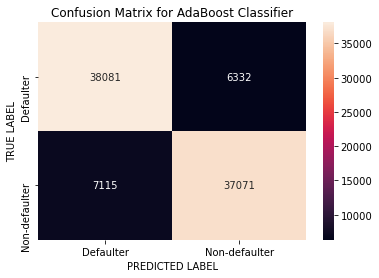

In [74]:
cm = confusion_matrix(y_test, predAB)

x_axis_labels = ["Defaulter","Non-defaulter"]
y_axis_labels = ["Defaulter","Non-defaulter"]

sns.heatmap(cm, annot = True, fmt = ".0f", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for AdaBoost Classifier')
plt.show()

# Cross Validation Score

In [75]:
cross_val_score(DTC, X, y, cv = 5).mean()*100

90.67512739559407

In [76]:
cross_val_score(RFC, X, y, cv = 5).mean()*100

94.74856215792867

In [77]:
cross_val_score(LR, X, y, cv = 5).mean()*100

77.08276917322046

In [78]:
cross_val_score(XGB, X, y, cv = 5).mean()*100

93.27767024001999

In [79]:
cross_val_score(AB, X, y, cv = 5).mean()*100

84.42410339140599

### Best Model - Random Forest Classifier

# ROC AUC Curve

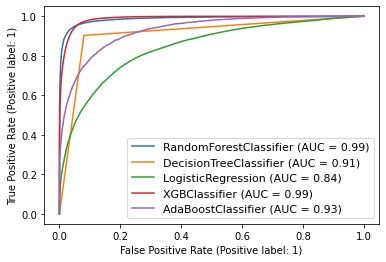

In [97]:
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 
disp = plot_roc_curve(RFC,X_test,y_test)
plot_roc_curve(DTC, X_test, y_test, ax=disp.ax_)
plot_roc_curve(LR, X_test, y_test, ax=disp.ax_)
plot_roc_curve(XGB, X_test, y_test, ax=disp.ax_)
plot_roc_curve(AB, X_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

# Hyperparameter Tuning

In [80]:
from sklearn.model_selection import GridSearchCV

In [93]:
credit_defaulter = RandomForestClassifier(criterion='entropy',max_depth=200, max_features='sqrt', max_leaf_nodes=20, n_estimators=100)
credit_defaulter.fit(X_train, y_train)
pred = credit_defaulter.predict(X_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

81.66006388333955


### I tried a lot of combinations but hyper parameter tuning doesn't seem to increase the accuracy.

In [100]:
Best_model = RandomForestClassifier()
Best_model.fit(X_train,y_train)

RandomForestClassifier()

# AUC ROC Curve for the best model

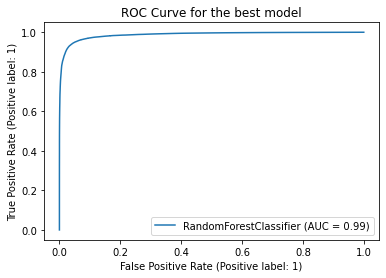

In [101]:
plot_roc_curve(Best_model, X_test, y_test)
plt.title('ROC Curve for the best model')
plt.show()

# Saving the Model

In [103]:
import pickle
filename = "credit_model.pkl"
pickle.dump(RFC,open(filename,'wb'))

# Prediction Results

In [105]:
prediction = Best_model.predict(X_test)
prediction

array([1, 0, 1, ..., 0, 0, 0], dtype=int64)

In [106]:
pd.DataFrame([Best_model.predict(X_test)[:],y_test[:]],index=["Predicted","Actual"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021